# Bathymetry basics

This notebook demonstrates the core functionality of the `bathy` package for loading, analysing, and visualising bathymetric data.

In [1]:
import bathy

## Load example data

The quickest way to get started is with the built-in sample dataset — a GEBCO 2025 extract covering the NE Atlantic (Celtic Sea / Bay of Biscay).

> GEBCO Compilation Group (2025) GEBCO 2025 Grid (doi:10.5285/37c52e96-24ea-67ce-e063-7086abc05f29)

In [2]:
data = bathy.sample_data()
data

<xarray.DataArray 'elevation' (lat: 839, lon: 1645)> Size: 3MB
[1380155 values with dtype=int16]
Coordinates:
  * lat      (lat) float64 7kB 46.05 46.05 46.06 46.06 ... 49.53 49.54 49.54
  * lon      (lon) float64 13kB -12.08 -12.08 -12.07 ... -5.24 -5.235 -5.231
Attributes:
    standard_name:       height_above_mean_sea_level
    long_name:           Elevation relative to sea level
    units:               m
    grid_mapping:        crs
    sdn_parameter_urn:   SDN:P01::BATHHGHT
    sdn_parameter_name:  Sea floor height (above mean sea level) {bathymetric...
    sdn_uom_urn:         SDN:P06::ULAA
    sdn_uom_name:        Metres

### Other ways to load data

In [3]:
# Download from GEBCO (saves to disk for reuse)
# data = bathy.load_gebco_opendap(
#     lon_range=(-12.08, -5.23),
#     lat_range=(46.05, 49.54),
#     save_path="ne_atlantic_gebco.nc",
# )

# Or use a preset region name
# data = bathy.load_gebco_opendap(region="mediterranean")

# Load from a local NetCDF or GeoTIFF
# data = bathy.load_bathymetry("gebco.nc", lon_range=(-10, -5), lat_range=(50, 55))
# data = bathy.load_bathymetry("elevation.tif")

In [4]:
# Clip to a smaller region
subset = data.sel(lon=slice(-10, -7), lat=slice(47, 49))
subset

<xarray.DataArray 'elevation' (lat: 480, lon: 720)> Size: 691kB
[345600 values with dtype=int16]
Coordinates:
  * lat      (lat) float64 4kB 47.0 47.01 47.01 47.01 ... 48.99 48.99 48.99 49.0
  * lon      (lon) float64 6kB -9.998 -9.994 -9.99 ... -7.01 -7.006 -7.002
Attributes:
    standard_name:       height_above_mean_sea_level
    long_name:           Elevation relative to sea level
    units:               m
    grid_mapping:        crs
    sdn_parameter_urn:   SDN:P01::BATHHGHT
    sdn_parameter_name:  Sea floor height (above mean sea level) {bathymetric...
    sdn_uom_urn:         SDN:P06::ULAA
    sdn_uom_name:        Metres

In [5]:
# Summary statistics
bathy.summary(data)

statistic,value
str,f64
"""count""",1.380155e6
"""mean""",-2319.787586
"""std""",2018.306424
"""min""",-4918.0
"""25%""",-4508.0
"""50%""",-2228.0
"""75%""",-154.0
"""max""",-48.0


## Visualisation

Create various visualisations of the bathymetry data.

(<Figure size 1000x800 with 2 Axes>,
 <Axes: xlabel='Longitude (°)', ylabel='Latitude (°)'>)

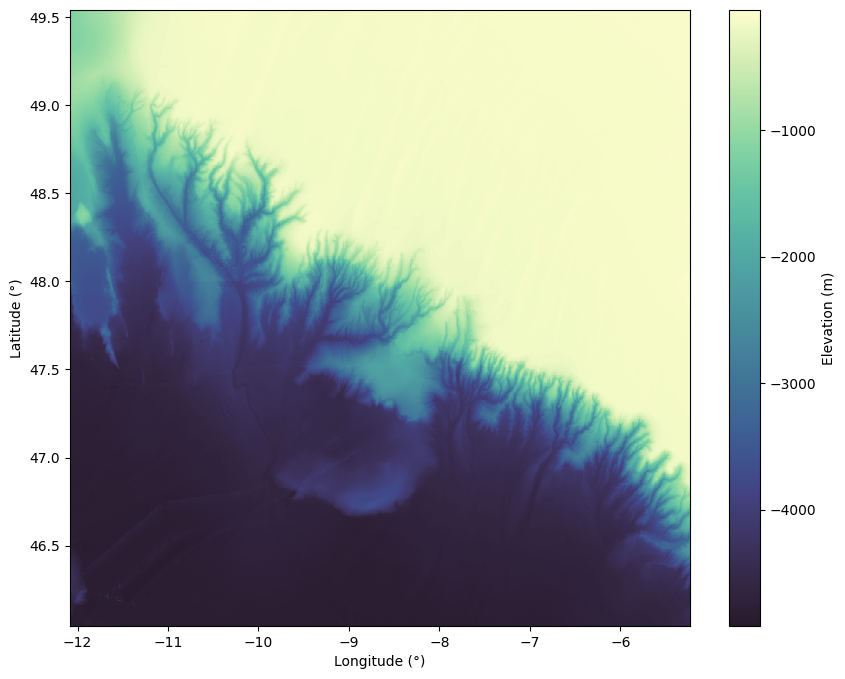

In [6]:
# Simple elevation plot
bathy.plot_bathy(data)

### Adding contours

All plot methods support an optional `contours` parameter to overlay bathymetric contour lines.

(<Figure size 1000x800 with 2 Axes>,
 <Axes: xlabel='Longitude (°)', ylabel='Latitude (°)'>)

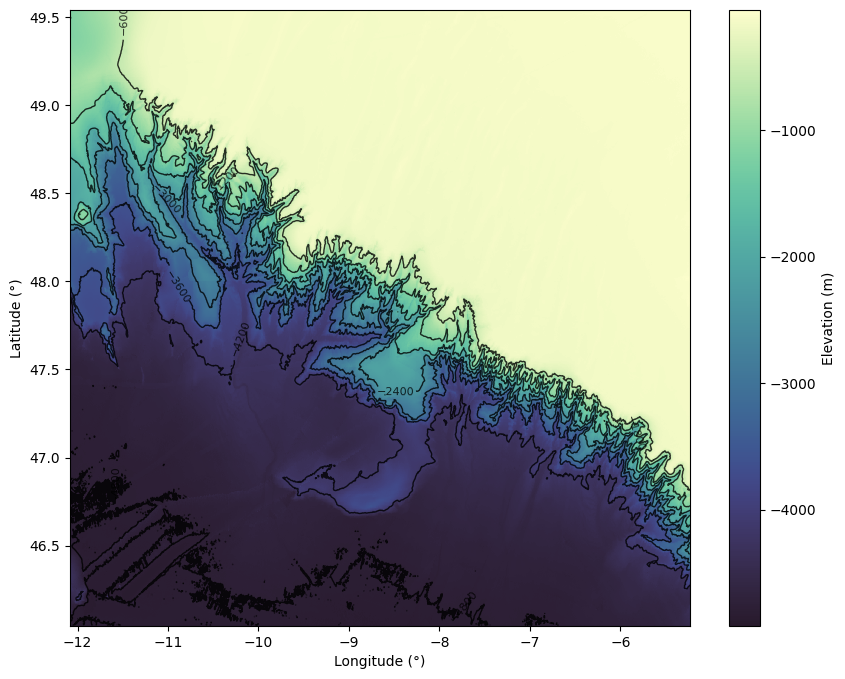

In [7]:
# Simple plot with 10 evenly-spaced contour levels
bathy.plot_bathy(data, contours=10)

(<Figure size 1000x800 with 2 Axes>,
 <Axes: xlabel='Longitude (°)', ylabel='Latitude (°)'>)

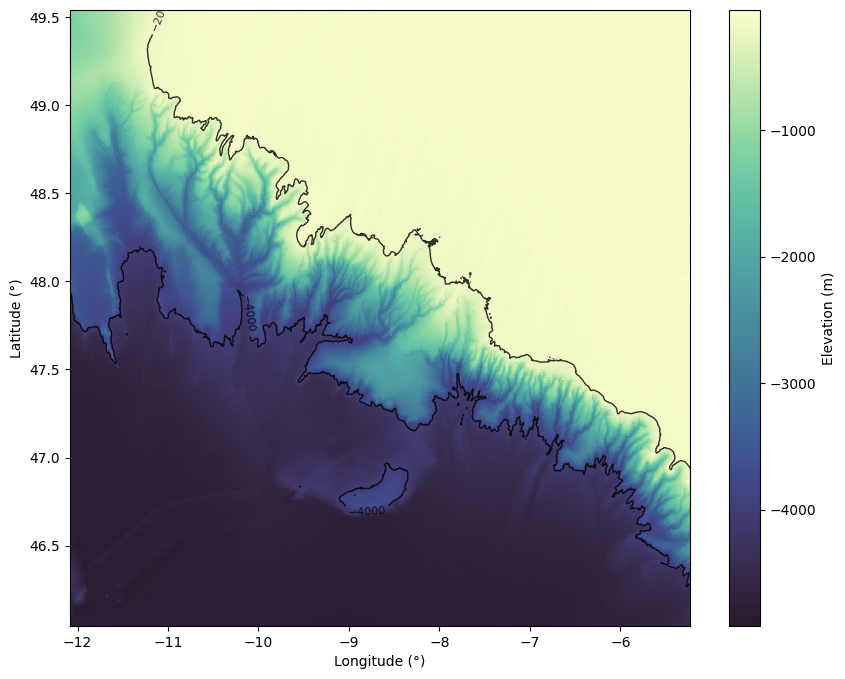

In [8]:
# Hillshade with specific depth contours (shelf edge, slope, abyssal depths)
bathy.plot_bathy(data, contours=[-200, -4000])

### Other visualizations

(<Figure size 1000x800 with 2 Axes>,
 <Axes: xlabel='Longitude (°)', ylabel='Latitude (°)'>)

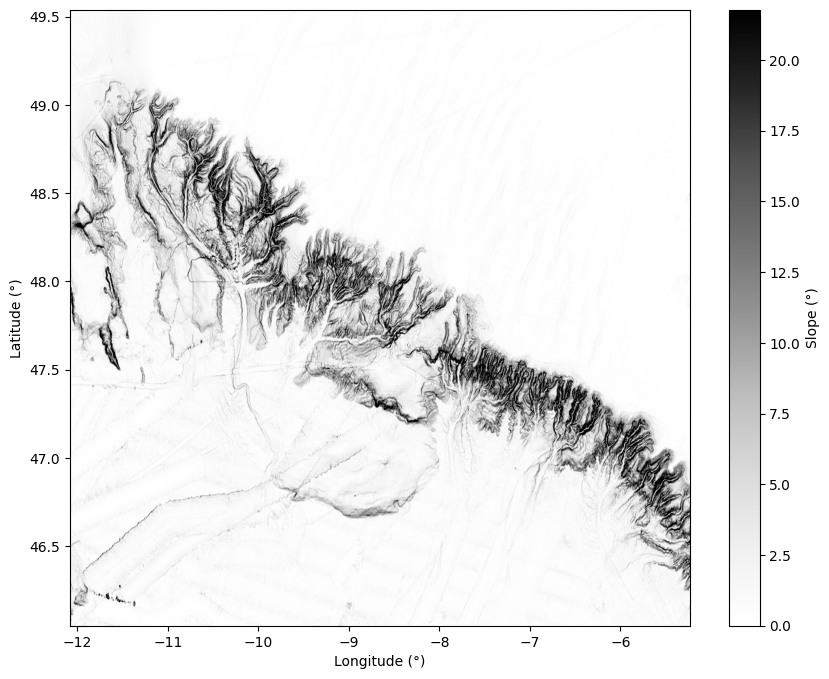

In [9]:
# Seafloor slope
bathy.plot_slope(data)

(<Figure size 1000x800 with 2 Axes>,
 <Axes: xlabel='Longitude (°)', ylabel='Latitude (°)'>)

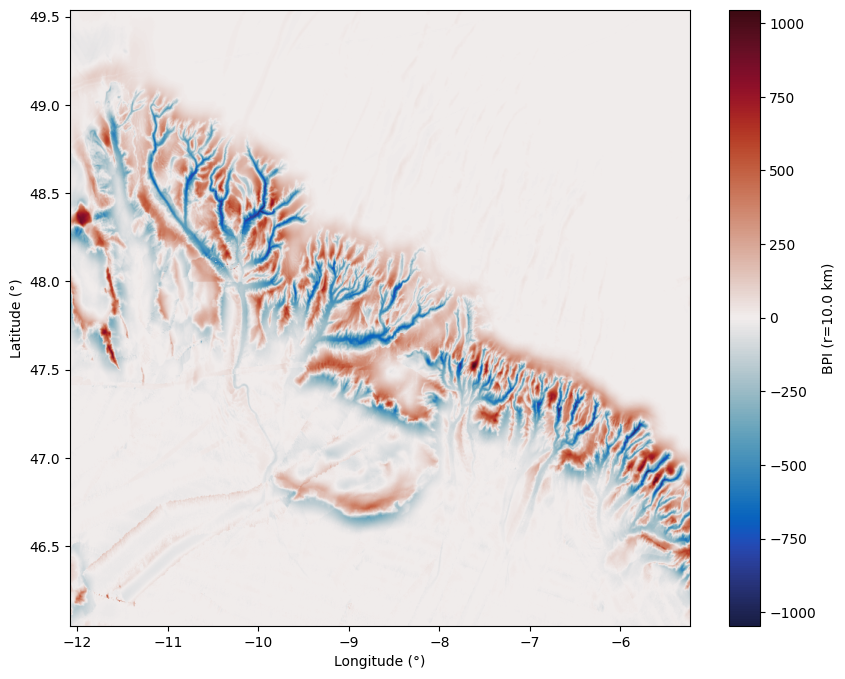

In [10]:
# Bathymetric Position Index (identifies ridges and valleys)
bathy.plot_bpi(data, radius_km=10.0)

(<Figure size 1000x800 with 2 Axes>,
 <Axes: xlabel='Longitude (°)', ylabel='Latitude (°)'>)

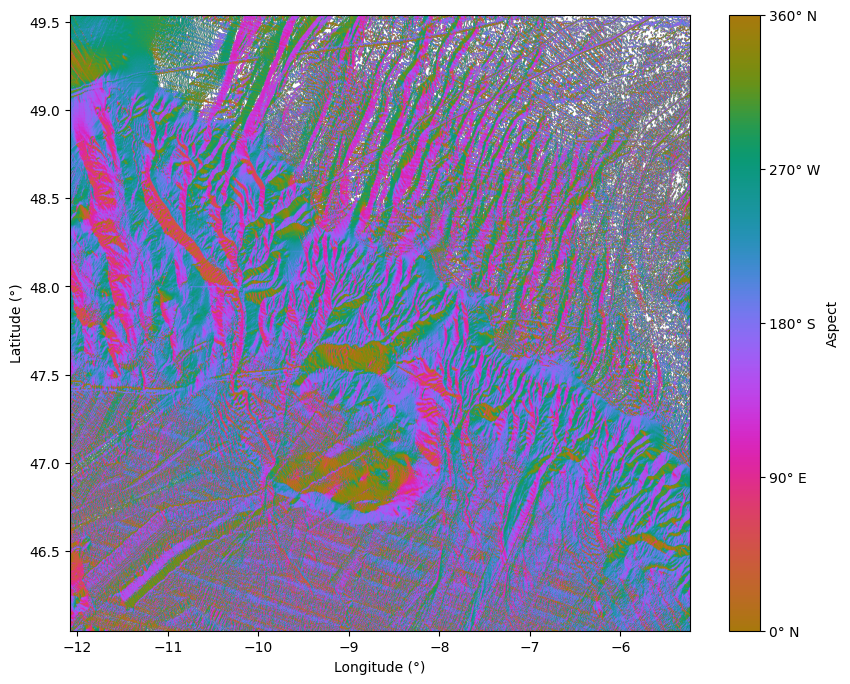

In [11]:
# Aspect — compass direction of steepest upslope gradient (0° = north, clockwise)
bathy.plot_aspect(data)

(<Figure size 1000x800 with 2 Axes>,
 <Axes: xlabel='Longitude (°)', ylabel='Latitude (°)'>)

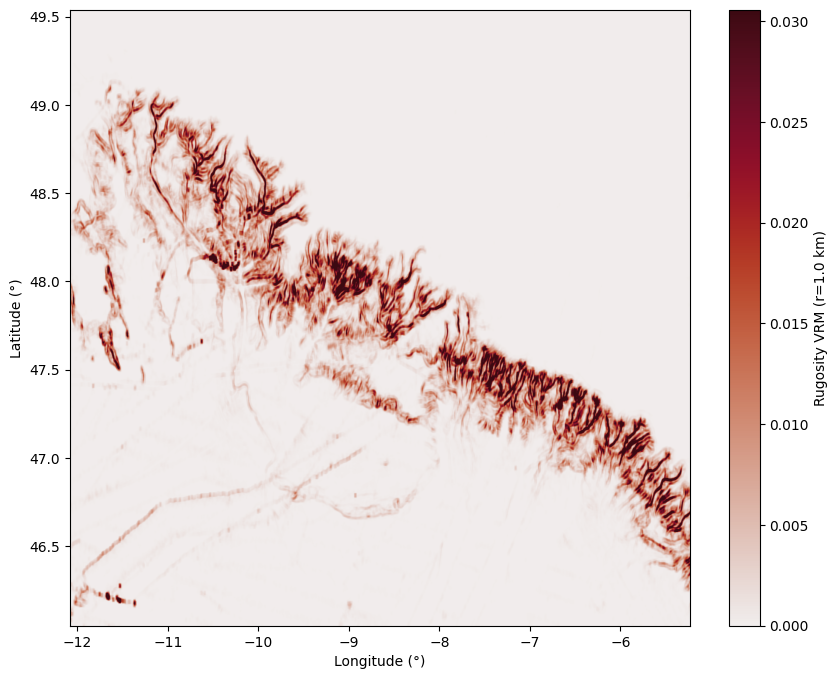

In [12]:
# Rugosity — Vector Ruggedness Measure (0 = flat, higher = more complex)
bathy.plot_rugosity(data, radius_km=1.0)

(<Figure size 1000x800 with 2 Axes>,
 <Axes: xlabel='Longitude (°)', ylabel='Latitude (°)'>)

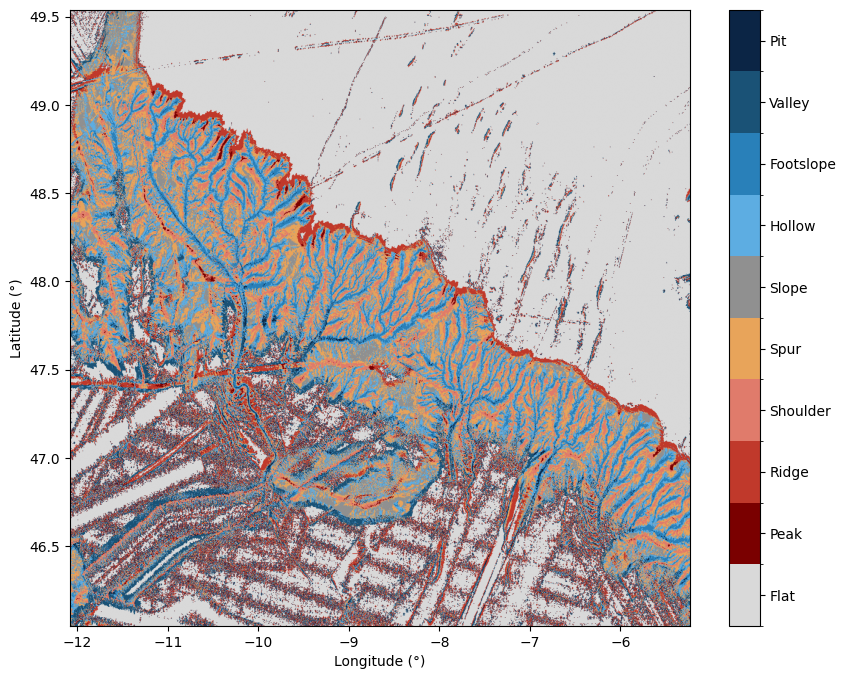

In [13]:
# Geomorphons — classify seafloor morphology into 10 landform types
bathy.plot_geomorphons(data, lookup_km=5.0)

### Overview

Plot all bathymetric analyses in a single publication-ready figure.

(<Figure size 1200x2000 with 15 Axes>,
 array([[<Axes: title={'center': 'Bathymetry'}, ylabel='Latitude (°)'>,
         <Axes: title={'center': 'Hillshade'}>],
        [<Axes: title={'center': 'Slope'}, ylabel='Latitude (°)'>,
         <Axes: title={'center': 'Aspect'}>],
        [<Axes: title={'center': 'Curvature'}, ylabel='Latitude (°)'>,
         <Axes: title={'center': 'BPI (r=5.0 km)'}>],
        [<Axes: title={'center': 'Rugosity (r=2.0 km)'}, xlabel='Longitude (°)', ylabel='Latitude (°)'>,
         <Axes: title={'center': 'Geomorphons (5.0 km)'}, xlabel='Longitude (°)'>]],
       dtype=object))

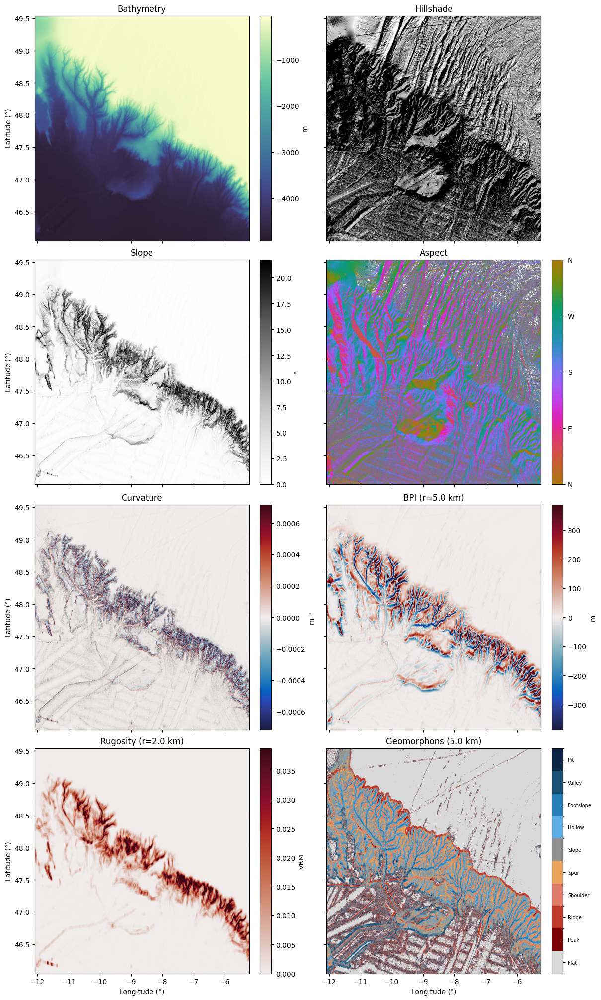

In [14]:
# All bathymetric analyses in one 2×4 figure
bathy.plot_overview(
    data, bpi_radius_km=5.0, rugosity_radius_km=2.0, geomorphons_lookup_km=5.0
)

(<Figure size 1000x800 with 2 Axes>,
 <Axes: xlabel='Longitude (°)', ylabel='Latitude (°)'>)

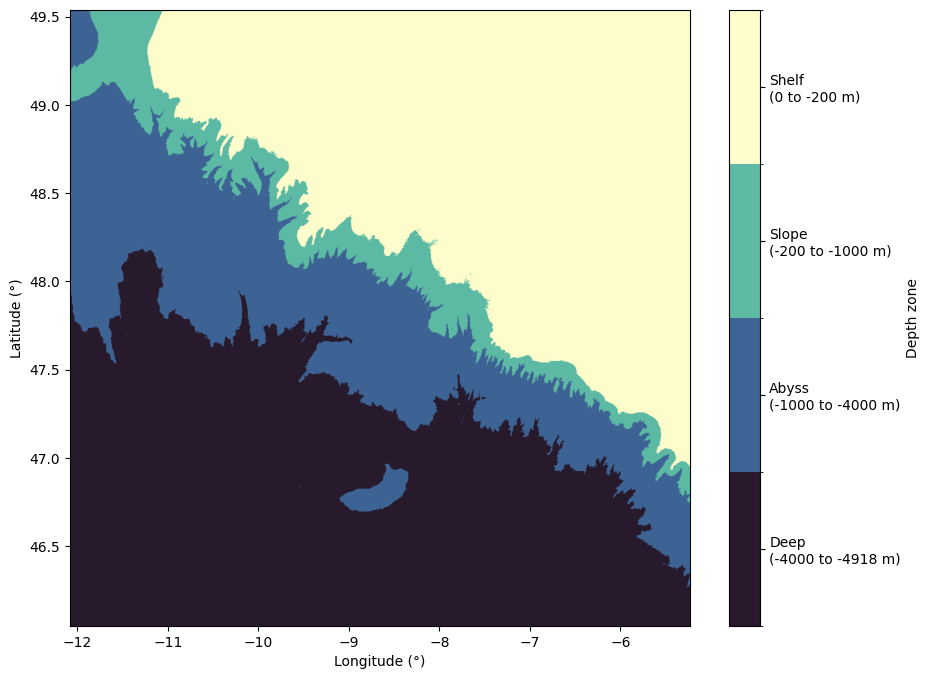

In [15]:
# Depth zones (shelf, slope, abyss)
bathy.plot_depth_zones(data)

(<Figure size 1000x600 with 1 Axes>,
 <Axes: xlabel='Elevation (m)', ylabel='Frequency'>)

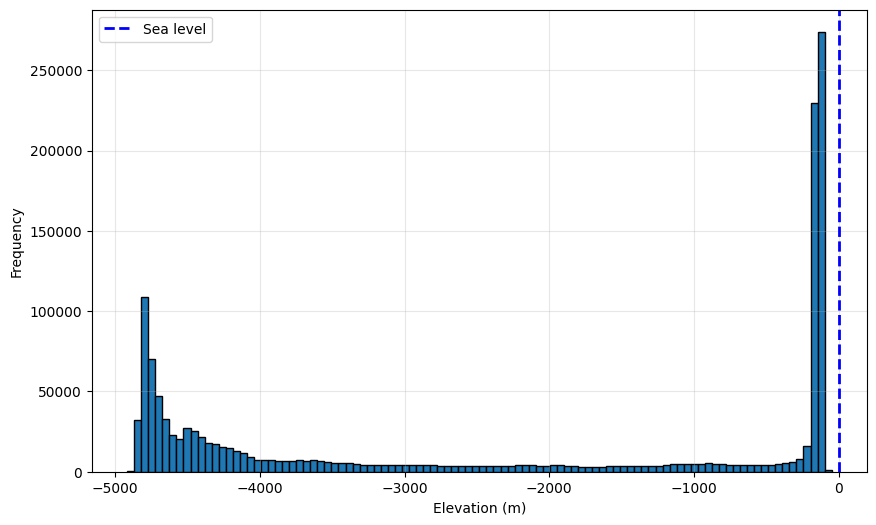

In [16]:
# Elevation histogram
bathy.plot_histogram(data, bins=100)

(<Figure size 1400x800 with 2 Axes>,
 <Axes3D: xlabel='Longitude (°)', ylabel='Latitude (°)', zlabel='Elevation (m)'>)

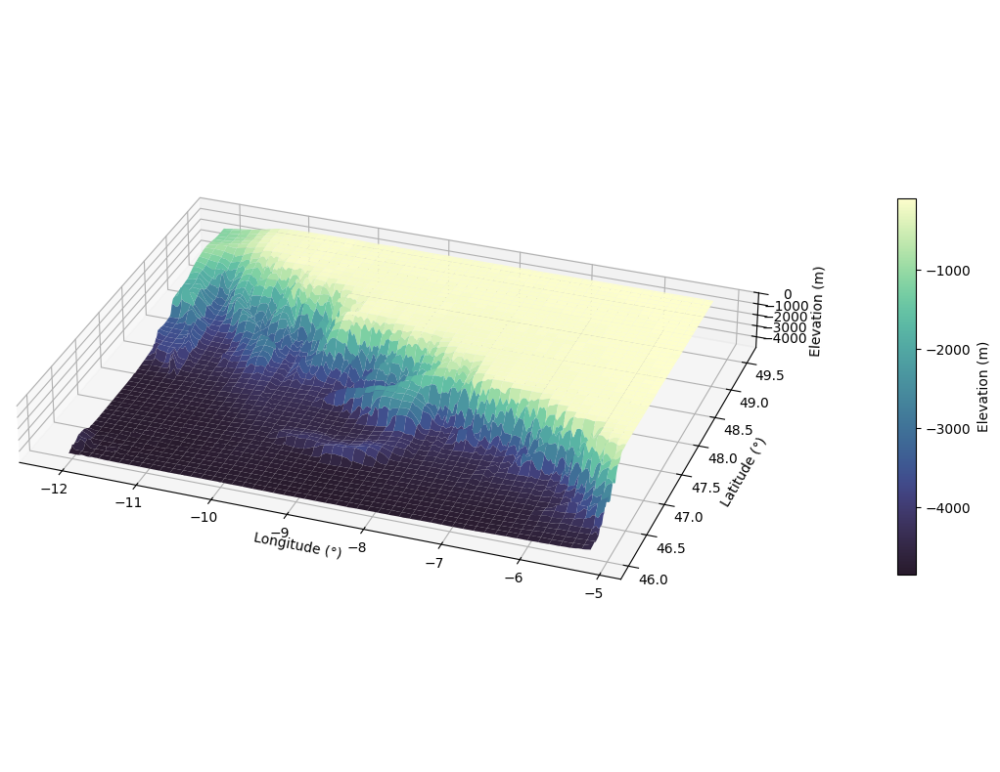

In [17]:
# 3D surface plot
bathy.plot_surface3d(
    data, stride=1, vertical_exaggeration=0.1, smooth=5, elev=30, azim=-70
)

## Hypsometric analysis

The hypsometric index (HI) quantifies the distribution of elevation within a region. It ranges from 0 to 1, where values below 0.5 indicate concave hypsometry (more area at lower elevations) and values above 0.5 indicate convex hypsometry.

In [18]:
# Calculate hypsometric index
hi = bathy.hypsometric_index(data)
print(f"Hypsometric Index: {hi:.3f}")

Hypsometric Index: 0.534


In [19]:
# Get the raw hypsometric curve data
df = bathy.hypsometric_curve(data)
df

relative_area,relative_elevation
f64,f64
1.0,0.005
0.999665,0.015
0.976401,0.025
0.897617,0.035
0.846694,0.045
…,…
0.382824,0.955
0.377111,0.965
0.365665,0.975


(<Figure size 800x800 with 1 Axes>,
 <Axes: xlabel='Relative Area (a/A)', ylabel='Relative Elevation (h/H)'>)

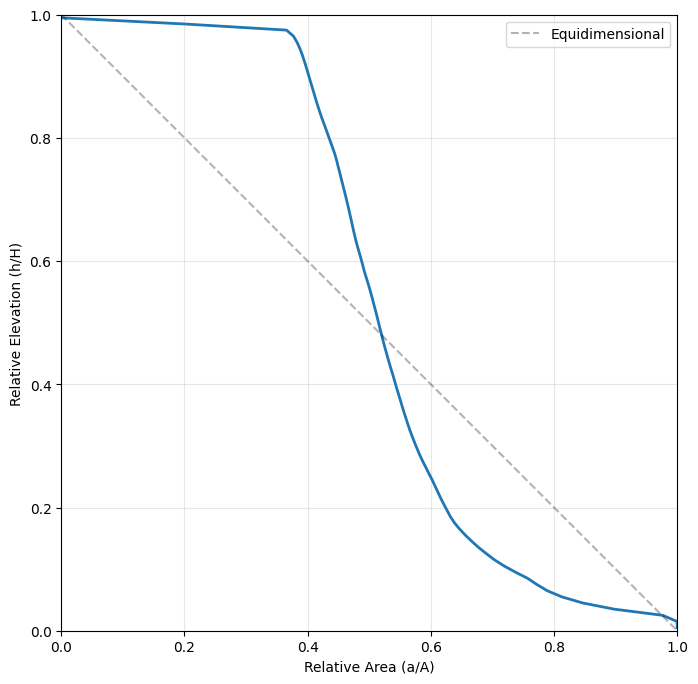

In [20]:
# Plot the hypsometric curve
bathy.plot_hypsometric_curve(data)

## Exporting data

Save bathymetry data to NetCDF or GeoTIFF formats.

In [21]:
# Export to NetCDF
# data.to_netcdf("output.nc")

# Export to GeoTIFF
# bathy.to_geotiff(data, "output.tif")

## Interactive map

Pan and zoom the bathymetry on a Leaflet basemap.


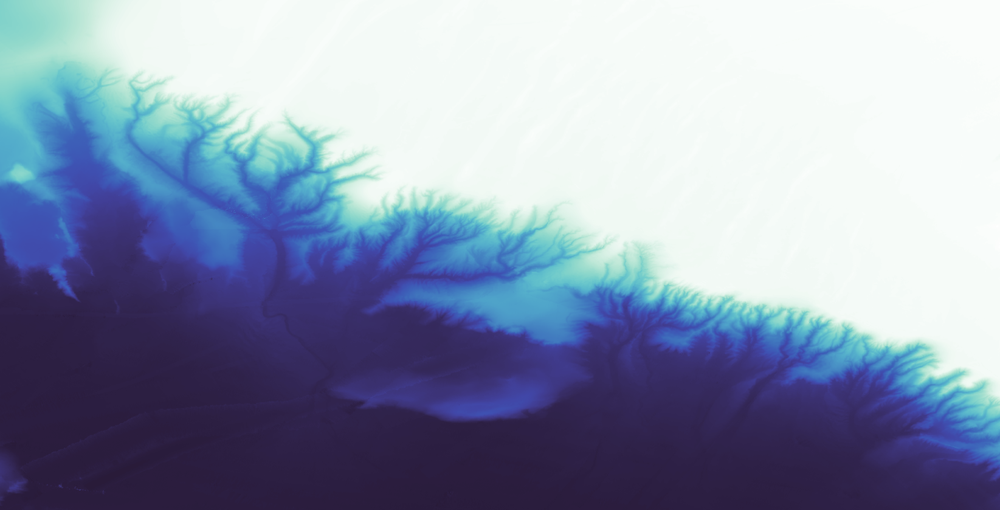
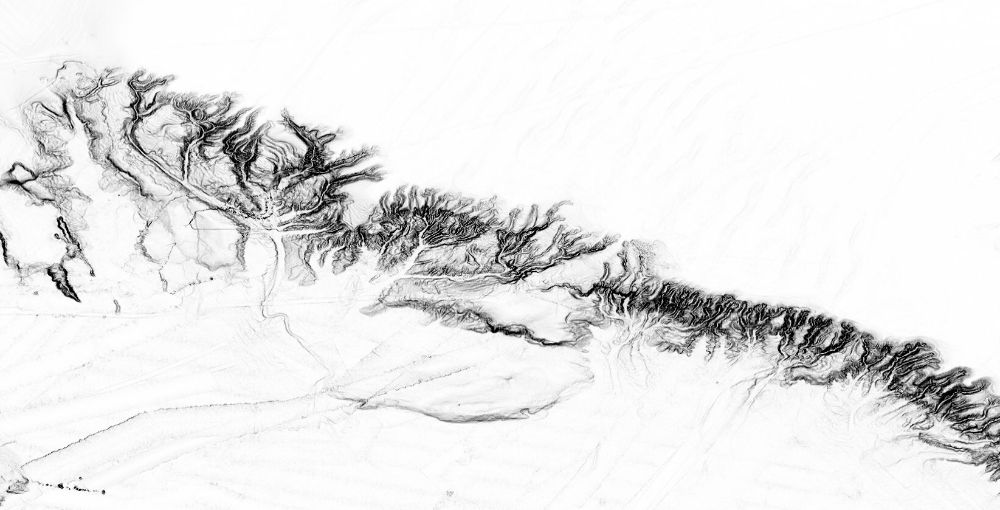
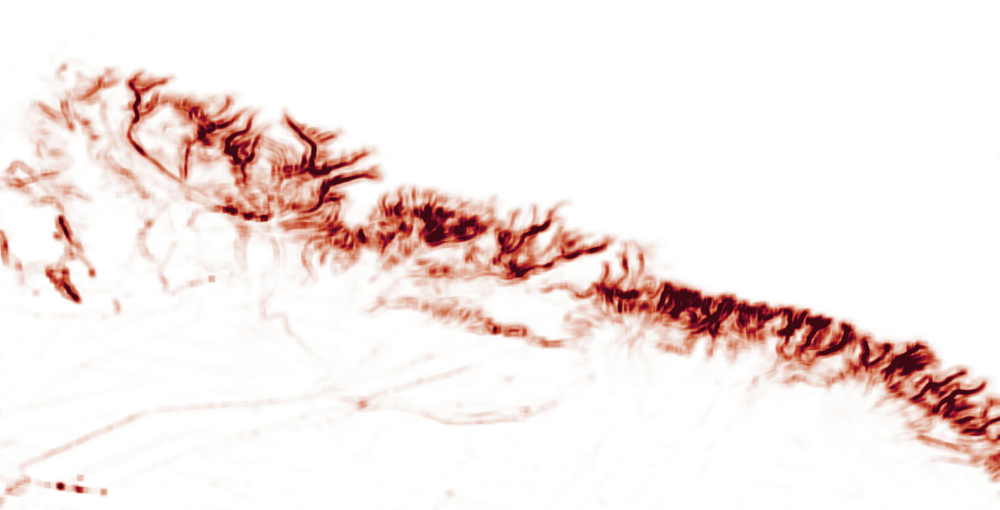

In [22]:
bathy.plot_interactive(
    data,
    overlays={
        "Slope": bathy.slope(data),
        "Rugosity": bathy.rugosity(data, radius_km=2.0),
    },
)